In [3]:
import sys
sys.path.append('../code')
from init_mooc_nb import *
init_notebook()

dims = SimpleNamespace(G=holoviews.Dimension(r'$G/G_0$'),
                       V_bias=holoviews.Dimension('$V_{bias}$'),
                       mu_t=holoviews.Dimension(r'${\mu}/{t_1}$'),
                       B_=holoviews.Dimension(r'$B$'),
                       phi=holoviews.Dimension(r'$\Phi/\Phi_0$'))



def nanowire_chain(L=None, periodic=False):
    lat = kwant.lattice.chain()

    if L is None:
        syst = kwant.Builder(kwant.TranslationalSymmetry(*lat.prim_vecs))
        L = 1
    else:
        syst = kwant.Builder()

    def onsite(onsite, p):
        return (2 * p.t - p.mu) * pauli.szs0 + p.B * pauli.s0sz + p.delta * pauli.sxs0

    for x in range(L):
        syst[lat(x)] = onsite

    def hop(site1, site2, p):
        return -p.t * pauli.szs0 - .5j * p.alpha * pauli.szsx

    def hopping_with_flux(site1, site2, p):
        phase = np.exp(1j * p.flux / 2)
        phase_factors = np.kron(np.diag([phase, phase.conj()]), pauli.s0)
        return 0.7 * phase_factors @ hop(site1, site1, p)

    syst[kwant.HoppingKind((1,), lat)] = hop

    if periodic:
        syst[lat(0), lat(L - 1)] = hopping_with_flux
    return syst




Populated the namespace with:
np, matplotlib, kwant, holoviews, init_notebook, SimpleNamespace, pprint_matrix, scientific_number, pretty_fmt_complex, plt, pf, display_html
from code/edx_components:
MoocVideo, PreprintReference, MoocDiscussion, MoocCheckboxesAssessment, MoocMultipleChoiceAssessment, MoocPeerAssessment, MoocSelfAssessment
from code/functions:
spectrum, hamiltonian_array, h_k, pauli
Using kwant 1.3.2 and holoviews 1.9.5
Executed on 2018-03-27 at 22:08:29.784060.


# Simulation: tweaking the nanowire

We have two choices for your coding assignments of this week. Consider the task complete when you finish one of the two.

This is especially true since both of the assignments constitute a complete paper :)

As usual, start by grabbing the notebooks of this week (`w2_majorana`). They are once again over [here](http://tiny.cc/topocm_smc).

## Tilted magnetic field

Explore what happens when we change one the important knobs of the nanowire model, the external magnetic field. We studied what happens when $B$ is pointing along the $z$ direction. However, what happens when the magnetic field is tilted?

Generalize the Hamiltonian of the nanowire to the case of a magnetic field with three components $B_x, B_y, B_z$. How do the new terms look like?

Go into the `nanowire` notebook. Modify the `nanowire_chain` function to include the magnetic field pointing in general direction.
Plot the band structure for different field directions, and compare to the original case of having only $B_z$. What changes?

Compare your results with what you find over here:

In [ ]:
display_html(PreprintReference('1403.4464'))

## From $4\pi$ to $2\pi$.

Now let's switch to the signatures of Majoranas. The code for these is in the `signatures` notebook.

How does the $4\pi$-periodic Josephson effect disapper? We argued that we cannot just remove a single crossing. Also periodicity isn't a continuous variable and cannot just change. So what is happening?

Study the spectrum of a superconducting ring as a function of magnetic field, as you make a transition between the trivial and the topological regimes.

What do you see? Compare your results with the paper below.

In [ ]:
PreprintReference("1210.3237")

In [ ]:
MoocSelfAssessment(due=5*7, review_due=6*7)

In [ ]:
MoocDiscussion('Labs', 'Majorana nanowire')

(50,)

In [29]:
np.shape([40,6])[0]

2

# Review assignment

As we mentioned, there are really hundreds of papers that use the models and concepts that we used in the lecture.

Here is a small selection of the ones that you may find interesting.

In [ ]:
display_html(PreprintReference('1204.2792',
                               description="Welcome to the real world."))

display_html(PreprintReference('1101.5795',
                               description="Majorana conductance with many modes."))

display_html(PreprintReference('1006.4395',
                               description="To play a nice melody, you just need a keyboard. "
                                           "This paper first showed how Majoranas in wire networks can be moved around"))

display_html(PreprintReference('1008.0629', description="Real nanowires are more complicated."))

### Bonus: Find your own paper to review!

Do you know of another paper that fits into the topics of this week, and you think is good?
Then you can get bonus points by reviewing that paper instead!

In [ ]:
MoocPeerAssessment(due=5*7, review_due=6*7)

In [ ]:
MoocDiscussion("Reviews", "Majoranas")

## Results

The papaer has simulations of a ring with an interruption, forming Josephson junction: 

If the infinite ring is in thermaldynamic ground state (quasiparticle poisoning rate is higher than flux tuning time), the current is $2\pi$ periodic in the topological regime. 
If the ring is finite, in the topological regime, as $\mu$ approaches transition point, coherence length of the wire increases and interior WF of two Majoranas start to overlap and cause splitting. The current is $4\pi$ periodic thanks to the shift of spectrum.
<br>
<br>
<br>
$\heartsuit$ By Anton : when deep in topological or trivial regime, $E(\phi)$ is $2\pi$ periodic (if just look at it without  tracing these curves). The reasoning : subgap spectrum $E(\phi)$ is directly related to what's happening at two side of the junction. If ring is long and we distribute the phase (which is induced by flux) uniformly on each site, the hopping energy $t_{N,1}exp(i\frac{\pi\Phi}{L h/2e } )$ is almost independent of flux, and the order parameter of s-wave SC across the junction is $2\pi$ periodic. The order parameter across the junction controls $E(\phi)$, so it is $2\pi$ periodic. 

But around the transition point, MZM can move around the ring more or less thanks to the small gap. And MZM is a fermionic excitation (with odd number of fermions), so it would pick up a phase $\frac{\pi\Phi}{h/2e}$, which means $4\pi$ ($2\Phi_0$) periodic.
<br>
<br>
<br>
My simulation result :

Fixed parameters : $\Delta=0.3$, $\mu=0.4$.     $t=1.0$, $\alpha=0.2$ ( spin-orbital coupling )

Tuning one parameter : $B$.  The phase transition is at $B=\sqrt{\mu^2+\Delta^2}=0.5$. Above this is topological.

$\heartsuit$  The following four points focus on the situation when $B \leq 0.5$ :

  (1) If the length of the ring is finite, $E(\phi)$ is $4\pi$ periodic at transition point.
  
  (2) If the length of the ring is finite, the subgap excitation spectrum, $E(\phi)$, is always $4\pi$ periodic. When $B$ is slightly away from transition point, $E(\phi)$  is completely different from $2\pi$ periodic because it is only slightly different from $E(\phi)$ at transition point. When $B$ is far away from transition point (deep in non-topological regime), the deviation from $2\pi$ periodic is smaller than the one around transition point but it still exists. 

  (3) If the length of the ring $L$ increases, the deviations mentioned in (2) would become smaller. If $L \rightarrow \infty$, $E(\phi)$ will go to $4\pi$ periodic.

  (4) Based on (1) $\sim$ (3), in an infinite ring, the period must have a sudden jump from $2\pi$ to $4\pi$ when $B$ moves infinitesimally away from transition point. This discontinuity problem can be resolved if $E(\phi) \rightarrow 0$ as $L \rightarrow \infty$ at transition point, which is shown in the last plot.



In [30]:
holoviews.plotting.mpl.MPLPlot.fig_rcparams['text.usetex'] = False
def nanowire_bulk():
    lat = kwant.lattice.chain()
    syst = kwant.Builder(kwant.TranslationalSymmetry(*lat.prim_vecs))

    def onsite(onsite, p):
        return (2 * p.t - p.mu) * pauli.szs0 + p.B * pauli.s0sz + p.delta * pauli.sxs0

    syst[lat(0)] = onsite

    def hop(site1, site2, p):
        return -p.t * pauli.szs0 - .5j * p.alpha * pauli.szsx

    syst[kwant.HoppingKind((1,), lat)] = hop

    return syst

def title(p):
    try:
        title = r"$\alpha={:.2}$, $\mu={:.5}$, $B={:.2}$, $\Delta={:.2}$"
        title = title.format(p.alpha, p.mu, p.B, p.delta)
    except AttributeError:
        title = r"$\mu={:.2}$, $B={:.2}$, $\Delta={:.2}$"
        title = title.format(p.mu, p.B, p.delta)
    return title

style = {'k_x': np.linspace(-np.pi, np.pi, 101),
         'xdim': r'$k$',
         'ydim': r'$E/t$',
         'xticks': [-1, 0, 1],
         'yticks': np.linspace(-0.6, 0.6, 7),
         'xlims': [-np.pi, np.pi],
         'ylims': [-0.7, 0.7],
         'title': title}

def nanowire_spectrum(mux=0.45, tx=1.0, alphax=0.2, deltax=0.3, Bx=0.5,trivial=False):
    
    p = SimpleNamespace(mu=mux, t=tx, alpha=alphax, delta=deltax, B=Bx)
    syst = nanowire_chain(L=60, periodic=True).finalized()

    def energy(flux):
        p.flux = flux
        H = syst.hamiltonian_submatrix(args=[p])
        return np.linalg.eigvalsh(H)
    
    flux_pt = 51
    fluxes = np.linspace(0, 4 * np.pi, flux_pt)
    spectrum = np.array([energy(flux) for flux in fluxes])

    # Find the two subgap states.
    if not trivial:
        N = spectrum.shape[1] // 2
        non_trivial = np.where((fluxes > np.pi) & (fluxes < 3 * np.pi))
        spectrum[non_trivial, N - 1: N + 1] = spectrum[non_trivial, N: N - 2: -1].copy()
        
    N = spectrum.shape[1] // 2
    spectrum_r = spectrum[:, N - 1: N + 1] 
    

    n_mid = (flux_pt-1)//2
    three_pts = [spectrum_r[0, 0], spectrum_r[n_mid, 0], spectrum_r[flux_pt-1, 0]]
    
    a=abs(three_pts[0]-three_pts[1])/three_pts[0]
    #print(abs(three_pts[0]-three_pts[1]), ":", three_pts[0]-three_pts[2])
    
    return three_pts, fluxes, spectrum_r

def plot_spectrum_nanowire(three_pts, fluxes, spectrum, ylim=[-0.2, 0.2]):
    kdims = [dims.phi, '$E$']
    plot = holoviews.Path((fluxes, spectrum), kdims=kdims)(style={'color': 'k'})
    
    ks = np.linspace(-0, np.pi)
    ec = np.ones(  (  np.shape(fluxes)[0] , 1  )  )*three_pts[1]
    plot *= holoviews.Path((fluxes, ec), kdims=kdims)(style={'linestyle':'--', 'color':'r'})
    
    ticks = {'xticks': [(0, '0'), (2 * np.pi, '1'), (4 * np.pi, '2')]}
    
    return plot[:, -0.7:0.7](plot=ticks)
    
def spectrum_one_parameter_set(mu=0.45, t=1.0, alpha=0.2, delta=0.3, B=0.5):
    three_pts, fluxes, spectrum = nanowire_spectrum(mu, t, alpha, delta, B,trivial = True)
    return plot_spectrum_nanowire(three_pts, fluxes, spectrum)
     


Bs = np.arange(0.0, 1.0, 0.02)
p = SimpleNamespace(t=1.0, B=0.5, delta=0.3, alpha=0.2, mu=0.4)

plots = {B: spectrum_one_parameter_set(p.mu, p.t, p.alpha, p.delta, B)  for B in Bs}

#holoviews.HoloMap(plots, kdims=[dims.mu_t])

syst = nanowire_bulk()


plots_bulk = {p.B: spectrum(syst, p, **style)
         for p.B in Bs}

(holoviews.HoloMap(plots, kdims=[dims.B_]) + 
 holoviews.HoloMap(plots_bulk, kdims=[dims.B_])   )
    



:Layout
   .HoloMap.I                                                                                                                                                             :HoloMap   [$B$]
      :Overlay
         .Path.I  :Path   [$\Phi/\Phi_0$,$E$]
         .Path.II :Path   [$\Phi/\Phi_0$,$E$]
   .HoloMap.Reverse_over_alpha_equals_0_full_stop_2_comma_reverse_over_mu_equals_0_full_stop_4_comma_B_equals_0_full_stop_0_comma_reverse_over_Delta_equals_0_full_stop_3 :HoloMap   [$B$]
      :Path   [$k$,$E/t$]

In [45]:
holoviews.plotting.mpl.MPLPlot.fig_rcparams['text.usetex'] = False
def nanowire_bulk():
    lat = kwant.lattice.chain()
    syst = kwant.Builder(kwant.TranslationalSymmetry(*lat.prim_vecs))

    def onsite(onsite, p):
        return (2 * p.t - p.mu) * pauli.szs0 + p.B * pauli.s0sz + p.delta * pauli.sxs0

    syst[lat(0)] = onsite

    def hop(site1, site2, p):
        return -p.t * pauli.szs0 - .5j * p.alpha * pauli.szsx

    syst[kwant.HoppingKind((1,), lat)] = hop

    return syst

def title(p):
    try:
        title = r"$\alpha={:.2}$, $\mu={:.5}$, $B={:.5}$, $\Delta={:.2}$"
        title = title.format(p.alpha, p.mu, p.B, p.delta)
    except AttributeError:
        title = r"$\mu={:.2}$, $B={:.2}$, $\Delta={:.2}$"
        title = title.format(p.mu, p.B, p.delta)
    return title

style = {'k_x': np.linspace(-np.pi, np.pi, 101),
         'xdim': r'$k$',
         'ydim': r'$E/t$',
         'xticks': [-1, 0, 1],
         'yticks': [-1, 0, 1],
         'xlims': [-np.pi, np.pi],
         'ylims': [-0.5, 0.5],
         'title': title}

def nanowire_spectrum(mux=0.45, tx=1.0, alphax=0.2, deltax=0.3, Bx=0.5,trivial=False):
    
    p = SimpleNamespace(mu=mux, t=tx, alpha=alphax, delta=deltax, B=Bx)
    syst = nanowire_chain(L=60, periodic=True).finalized()

    def energy(flux):
        p.flux = flux
        H = syst.hamiltonian_submatrix(args=[p])
        return np.linalg.eigvalsh(H)
    
    flux_pt = 51
    fluxes = np.linspace(0, 4 * np.pi, flux_pt)
    spectrum = np.array([energy(flux) for flux in fluxes])

    # Find the two subgap states.
    if not trivial:
        N = spectrum.shape[1] // 2
        non_trivial = np.where((fluxes > np.pi) & (fluxes < 3 * np.pi))
        spectrum[non_trivial, N - 1: N + 1] = spectrum[non_trivial, N: N - 2: -1].copy()
        
    N = spectrum.shape[1] // 2
    spectrum_r = spectrum[:, N - 1: N + 1] 
    

    n_mid = (flux_pt-1)//2
    three_pts = [spectrum_r[0, 0], spectrum_r[n_mid, 0], spectrum_r[flux_pt-1, 0]]
    
    a=abs(three_pts[0]-three_pts[1])/three_pts[0]
    #print(abs(three_pts[0]-three_pts[1]), ":", three_pts[0]-three_pts[2])
    
    return three_pts, fluxes, spectrum_r

def plot_spectrum_nanowire(three_pts, fluxes, spectrum, ylim=[-0.2, 0.2]):
    kdims = [dims.phi, '$E$']
    plot = holoviews.Path((fluxes, spectrum), kdims=kdims)(style={'color': 'k'})
    
    #plot *= holoviews.Path((fluxes, spectrum[:, N - 1]), kdims=kdims)(style={'color': 'r'})
    #plot *= holoviews.Path((fluxes, spectrum[:, N]), kdims=kdims)(style={'color': 'k'})
    
    ks = np.linspace(-0, np.pi)
    ec = np.ones(  (  np.shape(fluxes)[0] , 1  )  )*three_pts[1]
    plot *= holoviews.Path((fluxes, ec), kdims=kdims)(style={'linestyle':'--', 'color':'r'})
    
    ticks = {'xticks': [(0, '0'), (2 * np.pi, '1'), (4 * np.pi, '2')]}
    
    return plot[:, -0.02:0.02](plot=ticks)
    '''
    N = spectrum.shape[1] // 2
    kdims = [dims.phi, '$E$']
    plot = holoviews.Path((fluxes, spectrum), kdims=kdims)(style={'color': 'k', 'alpha': 0.4})
    plot *= holoviews.Path((fluxes, spectrum[:, N - 1]), kdims=kdims)(style={'color': 'r'})
    plot *= holoviews.Path((fluxes, spectrum[:, N]), kdims=kdims)(style={'color': 'k'})
    ticks = {'xticks': [(0, '0'), (2 * np.pi, '1'), (4 * np.pi, '2')]}
    return plot[:, -0.08:0.08](plot=ticks)
    '''
    
def spectrum_one_parameter_set(mu=0.45, t=1.0, alpha=0.2, delta=0.3, B=0.5):
    three_pts, fluxes, spectrum = nanowire_spectrum(mu, t, alpha, delta, B,trivial = True)
    return plot_spectrum_nanowire(three_pts, fluxes, spectrum)
     


Bs = np.arange(0.44, 0.51, 0.0005)
p = SimpleNamespace(t=1.0, B=0.5, delta=0.3, alpha=0.2, mu=0.4)

plots60 = {B: spectrum_one_parameter_set(p.mu, p.t, p.alpha, p.delta, B)  for B in Bs}





In [46]:
syst = nanowire_bulk()

plots_bulk = {p.B: spectrum(syst, p, **style)
         for p.B in Bs}
(holoviews.HoloMap(plots60, kdims=[dims.B_]) + 
 holoviews.HoloMap(plots100, kdims=[dims.B_]) + 
 holoviews.HoloMap(plots_bulk, kdims=[dims.B_])   ).cols(2)

:Layout
   .HoloMap.I                                                                                                                                                              :HoloMap   [$B$]
      :Overlay
         .Path.I  :Path   [$\Phi/\Phi_0$,$E$]
         .Path.II :Path   [$\Phi/\Phi_0$,$E$]
   .HoloMap.II                                                                                                                                                             :HoloMap   [$B$]
      :Overlay
         .Path.I  :Path   [$\Phi/\Phi_0$,$E$]
         .Path.II :Path   [$\Phi/\Phi_0$,$E$]
   .HoloMap.Reverse_over_alpha_equals_0_full_stop_2_comma_reverse_over_mu_equals_0_full_stop_4_comma_B_equals_0_full_stop_44_comma_reverse_over_Delta_equals_0_full_stop_3 :HoloMap   [$B$]
      :Path   [$k$,$E/t$]

In [67]:
holoviews.plotting.mpl.MPLPlot.fig_rcparams['text.usetex'] = False
def nanowire_bulk():
    lat = kwant.lattice.chain()
    syst = kwant.Builder(kwant.TranslationalSymmetry(*lat.prim_vecs))

    def onsite(onsite, p):
        return (2 * p.t - p.mu) * pauli.szs0 + p.B * pauli.s0sz + p.delta * pauli.sxs0

    syst[lat(0)] = onsite

    def hop(site1, site2, p):
        return -p.t * pauli.szs0 - .5j * p.alpha * pauli.szsx

    syst[kwant.HoppingKind((1,), lat)] = hop

    return syst

def title(p):
    try:
        title = r"$\alpha={:.2}$, $\mu={:.5}$, $B={:.5}$, $\Delta={:.2}$"
        title = title.format(p.alpha, p.mu, p.B, p.delta)
    except AttributeError:
        title = r"$\mu={:.2}$, $B={:.2}$, $\Delta={:.2}$"
        title = title.format(p.mu, p.B, p.delta)
    return title

style = {'k_x': np.linspace(-np.pi, np.pi, 101),
         'xdim': r'$k$',
         'ydim': r'$E/t$',
         'xticks': [-1, 0, 1],
         'yticks': np.linspace(-0.3, 0.3, 7),
         'xlims': [-np.pi, np.pi],
         'ylims': [-0.3, 0.3],
         'title': title}

def nanowire_spectrum(mux=0.45, tx=1.0, alphax=0.2, deltax=0.3, Bx=0.5,trivial=False):
    
    p = SimpleNamespace(mu=mux, t=tx, alpha=alphax, delta=deltax, B=Bx)
    
    flux_pt = 51
    Ls = [40, 80, 160]
    N_Ls = np.shape(Ls)[0]
    spectrums = np.zeros((  flux_pt ,  2*N_Ls  ))
    
    for idx in range(N_Ls):
        L = Ls[idx]
        syst = nanowire_chain(L, periodic=True).finalized()

        def energy(flux):
            p.flux = flux
            H = syst.hamiltonian_submatrix(args=[p])
            return np.linalg.eigvalsh(H)

        
        fluxes = np.linspace(0, 4 * np.pi, flux_pt)
        spectrum = np.array([energy(flux) for flux in fluxes])

        # Find the two subgap states.
        if not trivial:
            N = spectrum.shape[1] // 2
            non_trivial = np.where((fluxes > np.pi) & (fluxes < 3 * np.pi))
            spectrum[non_trivial, N - 1: N + 1] = spectrum[non_trivial, N: N - 2: -1].copy()

        N = spectrum.shape[1] // 2
        spectrums[:, 2*idx : 2*idx+2 ] = spectrum[:, N - 1: N + 1] 
        
        if abs( Bx - np.sqrt(mux**2 + deltax**2) ) < 1e-10 :
            n_mid = (flux_pt-1)//2
            three_pts = [spectrums[0, 2*idx], spectrums[n_mid, 2*idx], spectrums[flux_pt-1, 2*idx]]
            print(three_pts[1])
    
    
    
    return fluxes, spectrums

def plot_spectrum_nanowire(fluxes, spectrum, ylim=[-0.2, 0.2]):
    kdims = [dims.phi, '$E$']
    plot  = holoviews.Path((fluxes, spectrum[:,0:2]), kdims=kdims)(style={'color': 'r'})
    plot *= holoviews.Path((fluxes, spectrum[:,2:4]), kdims=kdims)(style={'color': 'g'})
    plot *= holoviews.Path((fluxes, spectrum[:,4:6]), kdims=kdims)(style={'color': 'b'})
  #  plot *= holoviews.Path((fluxes, spectrum[:,6:8]), kdims=kdims)(style={'color': 'g'})
  #  plot *= holoviews.Path((fluxes, spectrum[:,8:10]), kdims=kdims)(style={'color': 'm'})
    #plot *= holoviews.Path((fluxes, spectrum[:, N - 1]), kdims=kdims)(style={'color': 'r'})
    #plot *= holoviews.Path((fluxes, spectrum[:, N]), kdims=kdims)(style={'color': 'k'})
    
    ticks = {'xticks': [(0, '0'), (2 * np.pi, '1'), (4 * np.pi, '2')]}
    
    return plot[:, -0.01:0.01](plot=ticks)
    '''
    N = spectrum.shape[1] // 2
    kdims = [dims.phi, '$E$']
    plot = holoviews.Path((fluxes, spectrum), kdims=kdims)(style={'color': 'k', 'alpha': 0.4})
    plot *= holoviews.Path((fluxes, spectrum[:, N - 1]), kdims=kdims)(style={'color': 'r'})
    plot *= holoviews.Path((fluxes, spectrum[:, N]), kdims=kdims)(style={'color': 'k'})
    ticks = {'xticks': [(0, '0'), (2 * np.pi, '1'), (4 * np.pi, '2')]}
    return plot[:, -0.08:0.08](plot=ticks)
    '''
    
def spectrum_one_parameter_set(mu=0.45, t=1.0, alpha=0.2, delta=0.3, B=0.5):
    fluxes, spectrums = nanowire_spectrum(mu, t, alpha, delta, B,trivial = True)
    return plot_spectrum_nanowire(fluxes, spectrums)
     


Bs = np.arange(0.49, 0.503, 0.0005)
p = SimpleNamespace(t=1.0, B=0.5, delta=0.3, alpha=0.2, mu=0.4)


plotss = {B: spectrum_one_parameter_set(p.mu, p.t, p.alpha, p.delta, B)  for B in Bs}

#holoviews.HoloMap(plots, kdims=[dims.mu_t])
syst = nanowire_bulk()

plots_bulk = {p.B: spectrum(syst, p, **style)
         for p.B in Bs}

(holoviews.HoloMap(plotss, kdims=[dims.B_]) + 
 holoviews.HoloMap(plots_bulk, kdims=[dims.B_])   )
    


-0.00840104304878
-0.00341324933372
-0.00155854463574


:Layout
   .HoloMap.I                                                                                                                                                              :HoloMap   [$B$]
      :Overlay
         .Path.I   :Path   [$\Phi/\Phi_0$,$E$]
         .Path.II  :Path   [$\Phi/\Phi_0$,$E$]
         .Path.III :Path   [$\Phi/\Phi_0$,$E$]
   .HoloMap.Reverse_over_alpha_equals_0_full_stop_2_comma_reverse_over_mu_equals_0_full_stop_4_comma_B_equals_0_full_stop_49_comma_reverse_over_Delta_equals_0_full_stop_3 :HoloMap   [$B$]
      :Path   [$k$,$E/t$]

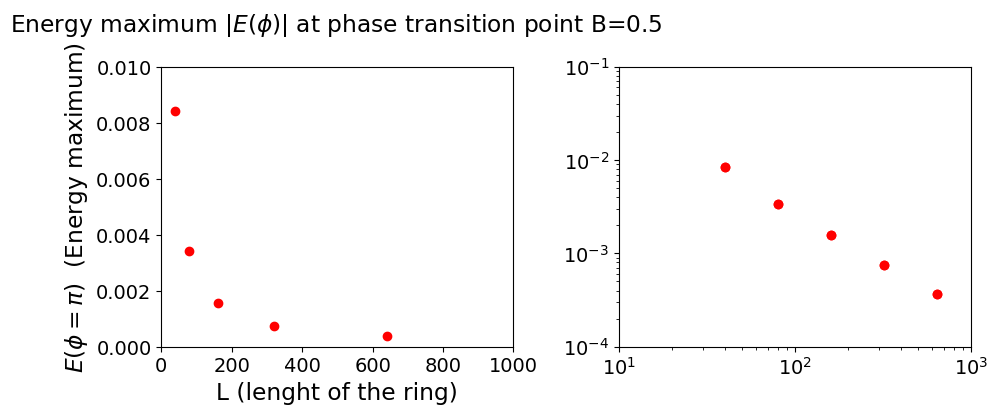

In [6]:
import matplotlib.pyplot as plt
xs = [40, 80, 160, 320, 640]
ys = [0.00840104304878,0.00341324933372,0.00155854463574,0.000748484018234,0.00036725863014]

plt.subplot(121)
plt.plot(xs, ys, 'ro')
plt.axis([0, 1000, 0, 0.01])
plt.ylabel('$E(\phi = \pi)$  (Energy maximum)')
plt.xlabel('L (lenght of the ring)')
plt.title('Energy maximum $|E(\phi)|$ at phase transition point B=0.5 \n')

plt.subplot(122)
plt.plot(xs, ys, 'ro')
plt.loglog(xs, ys, 'ro')
plt.axis([10, 1000, 1e-4, 0.1])
#plt.ylabel('$E(\phi = \pi)$  (Energy maximum)')
#plt.xlabel('L (lenght of the ring)')
#plt.title('Energy maximum at phase transition point \n')

plt.subplots_adjust(left=0.1, bottom=0.1, right=1.9, top=0.9 , wspace=0.3)
plt.show()

### In the paper : 

<img src="paper_1.PNG" width="70%">
Infinite ring and finite ring

<img src="paper_2.PNG" width="50%">
Current produced by thermaldynamical groundstate